#**Kahramanmaras Earthquake Data Analysis**

### **Importing necessary libraries**

In [ ]:
import pandas as pd
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

###**Reading csv file with pandas**

In [ ]:
df = pd.read_csv('kahramanmaras_earthquake_data.csv')

###**The first 10 rows from data**

In [ ]:
df.head(10)

,Date,Longitude,Latitude,Depth,Rms,Type,Magnitude,Location,EventID
0,2023-03-15T09:55:25,37.456,37.665,6.99,0.40,ML,1.6,Pazarcık (Kahramanmaraş),563211
1,2023-03-15T09:03:15,37.124,37.390,8.22,0.13,ML,2.0,Pazarcık (Kahramanmaraş),563206
2,2023-03-15T08:53:58,36.814,37.341,7.00,0.19,ML,2.3,Türkoğlu (Kahramanmaraş),563192
3,2023-03-15T08:44:36,37.376,37.856,7.00,0.49,ML,1.9,Çağlayancerit (Kahramanmaraş),563202
4,2023-03-15T08:42:15,36.300,37.801,6.94,0.34,ML,2.7,Andırın (Kahramanmaraş),563198
5,2023-03-15T08:40:12,36.668,38.143,7.21,0.76,ML,1.8,Göksun (Kahramanmaraş),563200
6,2023-03-15T08:11:23,37.411,38.254,6.99,0.88,ML,2.4,Elbistan (Kahramanmaraş),563187
7,2023-03-15T08:09:07,37.392,37.825,7.12,0.62,ML,1.9,Çağlayancerit (Kahramanmaraş),563194
8,2023-03-15T08:06:54,36.295,37.872,7.00,0.73,ML,2.3,Göksun (Kahramanmaraş),563197
9,2023-03-15T08:03:08,37.096,38.231,6.98,0.57,ML,1.9,Elbistan (Kahramanmaraş),563188


###**The last 10 rows from data**

In [ ]:
df.tail(10)

,Date,Longitude,Latitude,Depth,Rms,Type,Magnitude,Location,EventID
12933,2003-09-17T07:28:45,36.93,37.41,1.9,0.0070,Md,2.7,Türkoğlu (Kahramanmaraş),250705
12934,2003-09-13T19:44:32,36.42,37.50,6.9,0.1200,Md,3.5,Andırın (Kahramanmaraş),250675
12935,2003-07-23T21:37:30,36.29,37.42,4.5,0.0240,Md,3.9,Andırın (Kahramanmaraş),253393
12936,2003-07-15T05:57:25,37.54,37.57,6.9,0.4950,Md,3.0,Pazarcık (Kahramanmaraş),253325
12937,2003-05-13T11:39:53,36.42,37.47,10.3,0.3700,Md,3.4,Andırın (Kahramanmaraş),236981
12938,2003-04-20T07:59:49,36.36,37.47,13.9,0.0180,Md,3.3,Andırın (Kahramanmaraş),236819
12939,2003-03-12T09:36:02,37.31,37.65,15.9,0.4210,Md,3.6,Çağlayancerit (Kahramanmaraş),237366
12940,2003-02-19T18:33:40,37.29,37.35,2.0,0.2097,Md,2.9,Pazarcık (Kahramanmaraş),237316
12941,2003-01-30T08:47:11,37.32,37.80,7.7,0.0410,Md,3.4,Çağlayancerit (Kahramanmaraş),237291
12942,2003-01-20T04:05:39,36.75,37.71,13.1,0.4840,Md,3.0,Onikişubat (Kahramanmaraş),237259


###**Data has 12943 rows and 9 columns**

In [ ]:
df.shape

(12943, 9)

###**General information about data** There is no null value in data

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12943 entries, 0 to 12942
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       12943 non-null  object 
 1   Longitude  12943 non-null  float64
 2   Latitude   12943 non-null  float64
 3   Depth      12943 non-null  float64
 4   Rms        12943 non-null  float64
 5   Type       12943 non-null  object 
 6   Magnitude  12943 non-null  float64
 7   Location   12943 non-null  object 
 8   EventID    12943 non-null  int64  
dtypes: float64(5), int64(1), object(3)
memory usage: 910.2+ KB


###**Split function for splitting 'Date' and 'Time'**
###**Also splitting 'Date' to year,month and day**

In [ ]:
splitted = df['Date'].str.split('T', n=1,expand=True)
 
df['Date'] = splitted[0]
df['Time'] = splitted[1].str[:-3]

splitted = df['Date'].str.split('-', expand=True)
 
df['Day'] = splitted[2].astype('int')
df['Month'] = splitted[1].astype('int')
df['Year'] = splitted[0].astype('int')

df.head()

,Date,Longitude,Latitude,Depth,Rms,Type,Magnitude,Location,EventID,Time,Day,Month,Year
0,2023-03-15,37.456,37.665,6.99,0.40,ML,1.6,Pazarcık (Kahramanmaraş),563211,09:55,15,3,2023
1,2023-03-15,37.124,37.390,8.22,0.13,ML,2.0,Pazarcık (Kahramanmaraş),563206,09:03,15,3,2023
2,2023-03-15,36.814,37.341,7.00,0.19,ML,2.3,Türkoğlu (Kahramanmaraş),563192,08:53,15,3,2023
3,2023-03-15,37.376,37.856,7.00,0.49,ML,1.9,Çağlayancerit (Kahramanmaraş),563202,08:44,15,3,2023
4,2023-03-15,36.300,37.801,6.94,0.34,ML,2.7,Andırın (Kahramanmaraş),563198,08:42,15,3,2023


###**'Date' column are in the form of an object**
###**Changing types as a Datetime**

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12943 entries, 0 to 12942
Data columns (total 13 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       12943 non-null  object 
 1   Longitude  12943 non-null  float64
 2   Latitude   12943 non-null  float64
 3   Depth      12943 non-null  float64
 4   Rms        12943 non-null  float64
 5   Type       12943 non-null  object 
 6   Magnitude  12943 non-null  float64
 7   Location   12943 non-null  object 
 8   EventID    12943 non-null  int64  
 9   Time       12943 non-null  object 
 10  Day        12943 non-null  int64  
 11  Month      12943 non-null  int64  
 12  Year       12943 non-null  int64  
dtypes: float64(5), int64(4), object(4)
memory usage: 1.3+ MB


In [ ]:
df['Date'] = pd.to_datetime(df['Date'])
#df['Time'] = pd.to_datetime(df['Time'])

### **Creating a new column contains week**

In [ ]:
df['Week'] = df['Date'].dt.isocalendar().week

In [ ]:
df

,Date,Longitude,Latitude,Depth,Rms,Type,Magnitude,Location,EventID,Time,Day,Month,Year,Week
0,2023-03-15,37.456,37.665,6.99,0.4000,ML,1.6,Pazarcık (Kahramanmaraş),563211,09:55,15,3,2023,11
1,2023-03-15,37.124,37.390,8.22,0.1300,ML,2.0,Pazarcık (Kahramanmaraş),563206,09:03,15,3,2023,11
2,2023-03-15,36.814,37.341,7.00,0.1900,ML,2.3,Türkoğlu (Kahramanmaraş),563192,08:53,15,3,2023,11
3,2023-03-15,37.376,37.856,7.00,0.4900,ML,1.9,Çağlayancerit (Kahramanmaraş),563202,08:44,15,3,2023,11
4,2023-03-15,36.300,37.801,6.94,0.3400,ML,2.7,Andırın (Kahramanmaraş),563198,08:42,15,3,2023,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12938,2003-04-20,36.360,37.470,13.90,0.0180,Md,3.3,Andırın (Kahramanmaraş),236819,07:59,20,4,2003,16
12939,2003-03-12,37.310,37.650,15.90,0.4210,Md,3.6,Çağlayancerit (Kahramanmaraş),237366,09:36,12,3,2003,11
12940,2003-02-19,37.290,37.350,2.00,0.2097,Md,2.9,Pazarcık (Kahramanmaraş),237316,18:33,19,2,2003,8
12941,2003-01-30,37.320,37.800,7.70,0.0410,Md,3.4,Çağlayancerit (Kahramanmaraş),237291,08:47,30,1,2003,5


###**'Date' and 'Time' columns are now datetime type**

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12943 entries, 0 to 12942
Data columns (total 14 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       12943 non-null  datetime64[ns]
 1   Longitude  12943 non-null  float64       
 2   Latitude   12943 non-null  float64       
 3   Depth      12943 non-null  float64       
 4   Rms        12943 non-null  float64       
 5   Type       12943 non-null  object        
 6   Magnitude  12943 non-null  float64       
 7   Location   12943 non-null  object        
 8   EventID    12943 non-null  int64         
 9   Time       12943 non-null  object        
 10  Day        12943 non-null  int64         
 11  Month      12943 non-null  int64         
 12  Year       12943 non-null  int64         
 13  Week       12943 non-null  UInt32        
dtypes: UInt32(1), datetime64[ns](1), float64(5), int64(4), object(3)
memory usage: 1.3+ MB


### **Since measurement types have upper and lower case differences, I equated them to see the only unique names.**

In [ ]:
df['Type'].unique()

array(['ML', 'MW', 'Mw', 'Md', 'Ml'], dtype=object)

In [ ]:
df['Type'] = df['Type'].replace(['Mw','Ml'], ['MW','ML'])
df['Type'].unique()

array(['ML', 'MW', 'Md'], dtype=object)

### **This plot shows all earthquakes in the area. Including those less than 3. It's nearly symmetric**

Text(0.5, 1.0, 'Number of Earthquake Magnitudes')

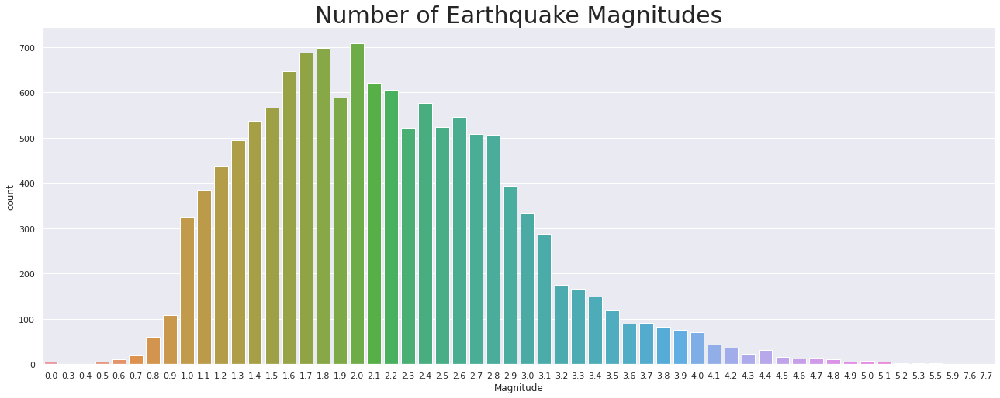

In [ ]:
sns.set(rc={'figure.figsize':(22,8)})
sns.countplot(x=df['Magnitude']).set_title('Number of Earthquake Magnitudes', fontsize=30)

### **Choosing earthquake magnitudes greater than 3**

In [ ]:
df = df[df['Magnitude'] >=3]

In [ ]:
df.shape

(1858, 14)

### **This plot shows the counts of Earthquake Magnitudes Greater Than 3**

Text(0.5, 1.0, 'Counts of Earthquake Magnitudes Greater Than 3')

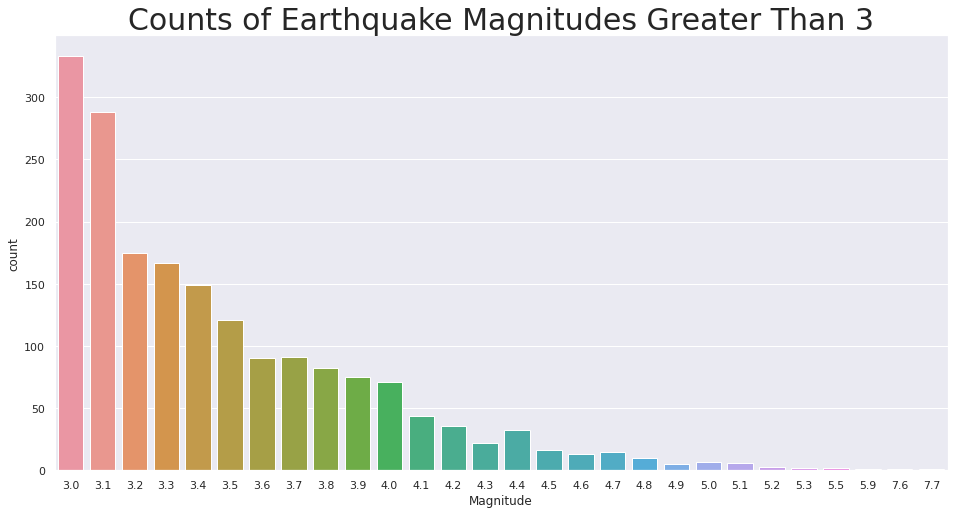

In [ ]:
sns.set(rc={'figure.figsize':(16,8)})
sns.countplot(x=df['Magnitude']).set_title('Counts of Earthquake Magnitudes Greater Than 3', fontsize=30)

### **This figures shows the number of earthquakes in Kahramanmaraş region over years,months,weeks and days.**

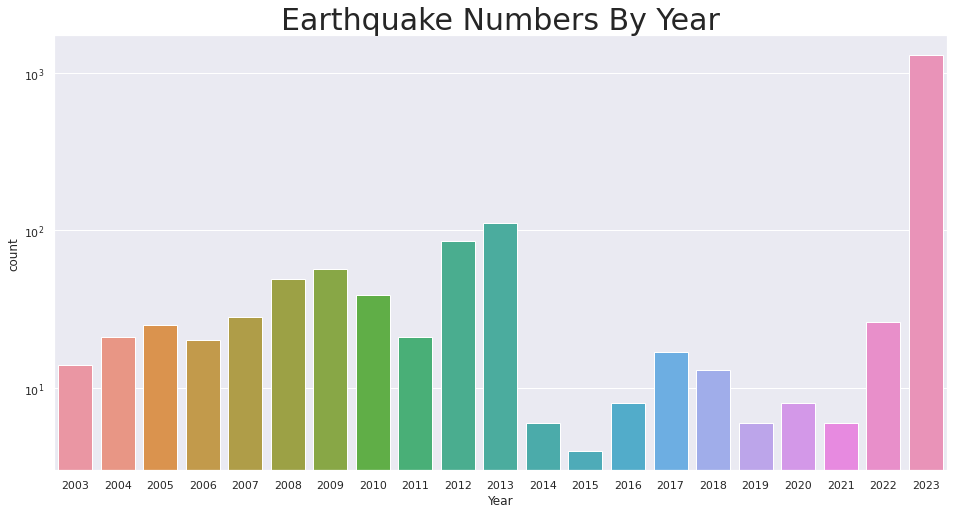

In [ ]:
sns.set(rc={'figure.figsize':(16,8)})
sns.countplot(x=df['Year']).set_title('Earthquake Numbers By Year', fontsize=30)
plt.yscale('log')

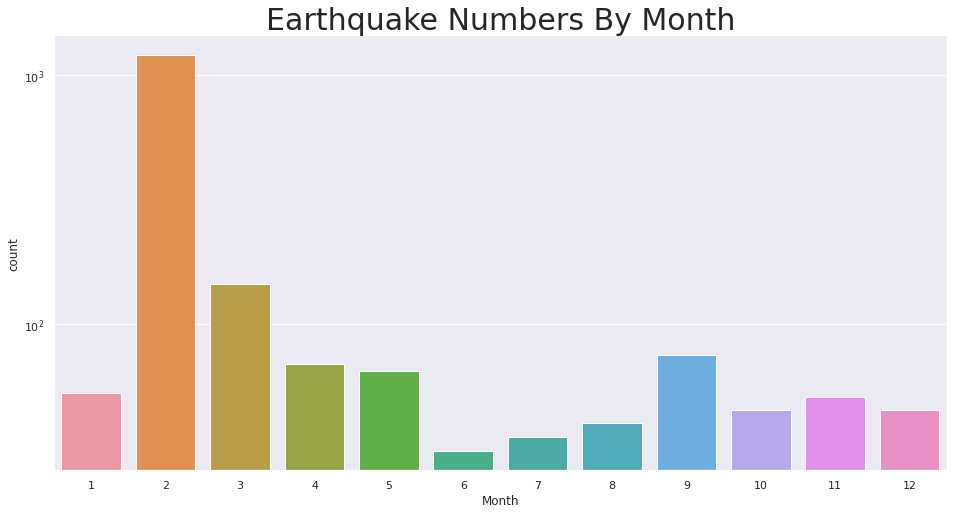

In [ ]:
sns.countplot(x=df['Month']).set_title('Earthquake Numbers By Month', fontsize=30)
plt.yscale('log')

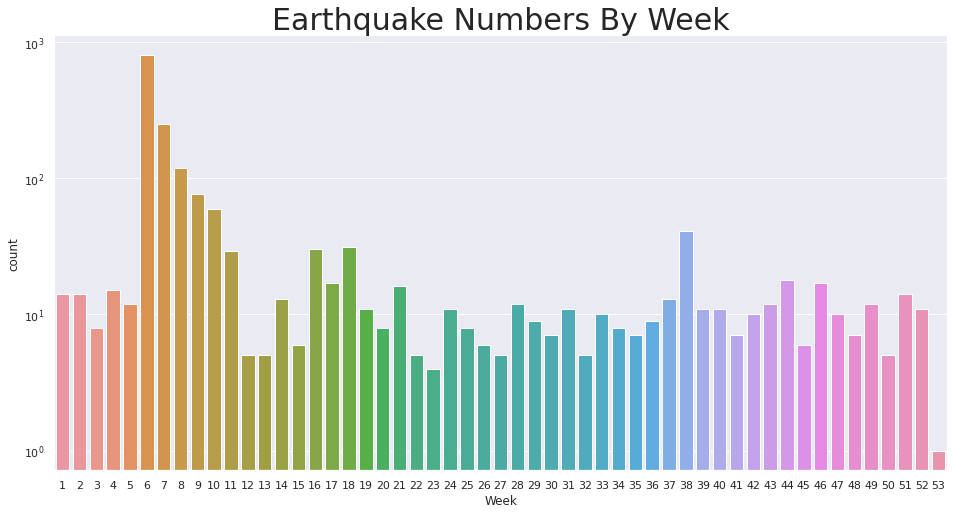

In [ ]:
sns.countplot(x=df['Week']).set_title('Earthquake Numbers By Week', fontsize=30)
plt.yscale('log')

Text(0.5, 1.0, 'Earthquake Numbers By Day')

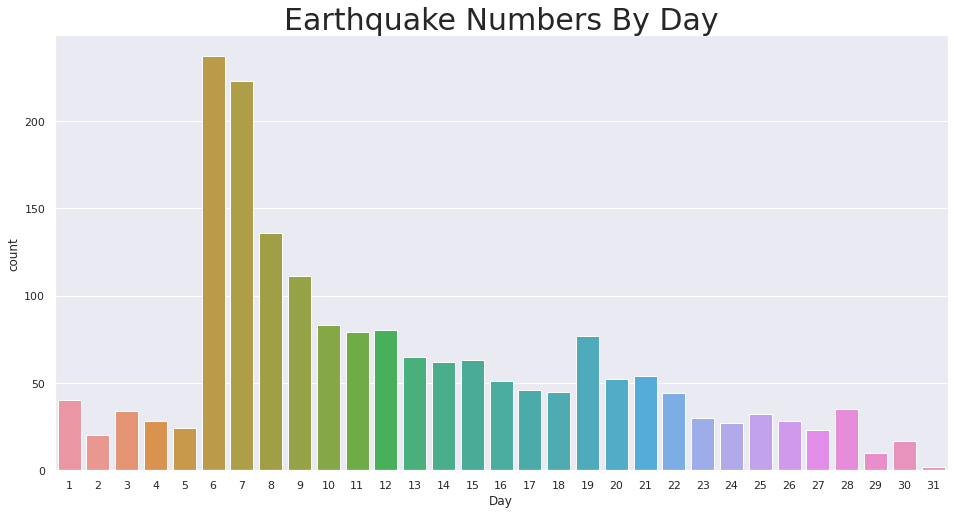

In [ ]:
sns.countplot(x=df['Day']).set_title('Earthquake Numbers By Day', fontsize=30)

### **This figure shows earthquake magnitudes according to regions and years.**

In [ ]:
fig = px.scatter(df, x="Date", y="Magnitude", color="Location",hover_data=["Day","Depth"],size='Magnitude')
fig.update_layout(title="Date/Magnitude Plot (Displays Information When Hover)")
fig.show()

### **Number of earthquakes according to earthquake-affected regions**

Text(0.5, 1.0, 'Earthquake Numbers By Region')

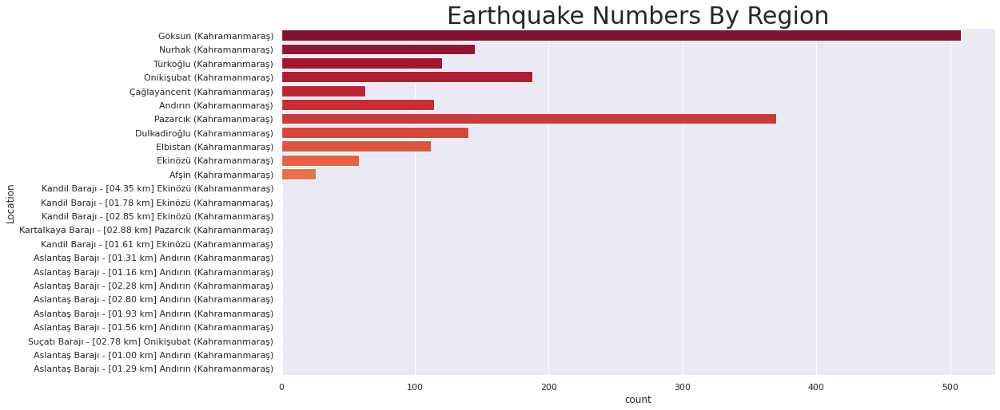

In [ ]:
sns.set(rc={'figure.figsize':(16,8)})
sns.countplot(y=df['Location'],palette="YlOrRd_r").set_title('Earthquake Numbers By Region', fontsize=30)

In [ ]:
loc_freq = df['Location'].value_counts()

### **The same information shown with a pie chart**

In [ ]:
fig = px.pie(loc_freq, values=loc_freq, names=loc_freq.index,width=1500, height=800)
fig.update_layout(title="Number of Earthquakes by Region (Displays Information When Hover)")
fig.show()

### **Line plot of the maximum earthquake magnitudes seen by date**

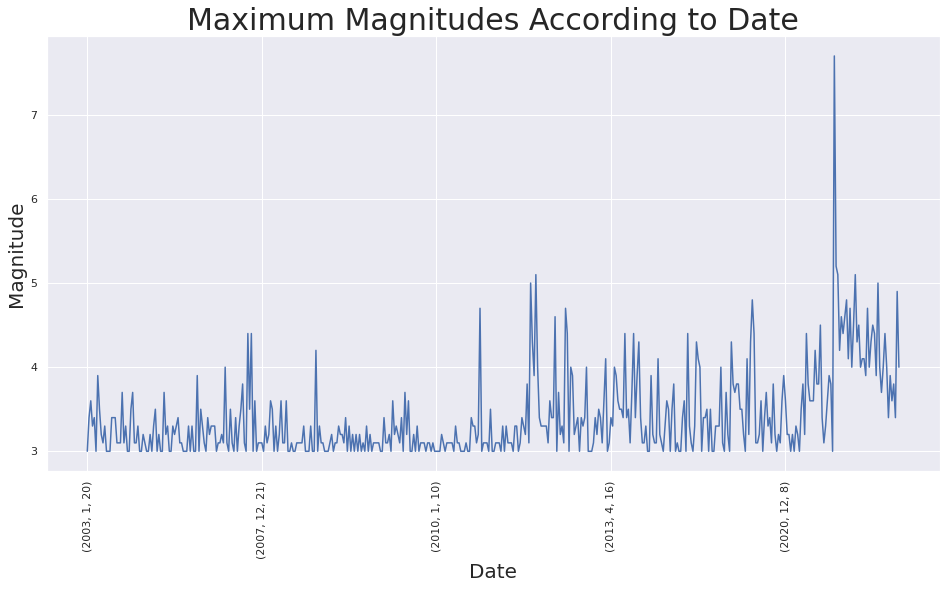

In [ ]:
grouped = df.groupby(by=[df.Year,df.Month,df.Day])['Magnitude'].max()
grouped.plot()
plt.xticks(rotation=90)
plt.xlabel('Date',fontsize=20)
plt.ylabel('Magnitude',fontsize=20)
plt.title("Maximum Magnitudes According to Date",size=30)
plt.show()

### **This plot shows earthquake magnitudes and depths according to dates.**

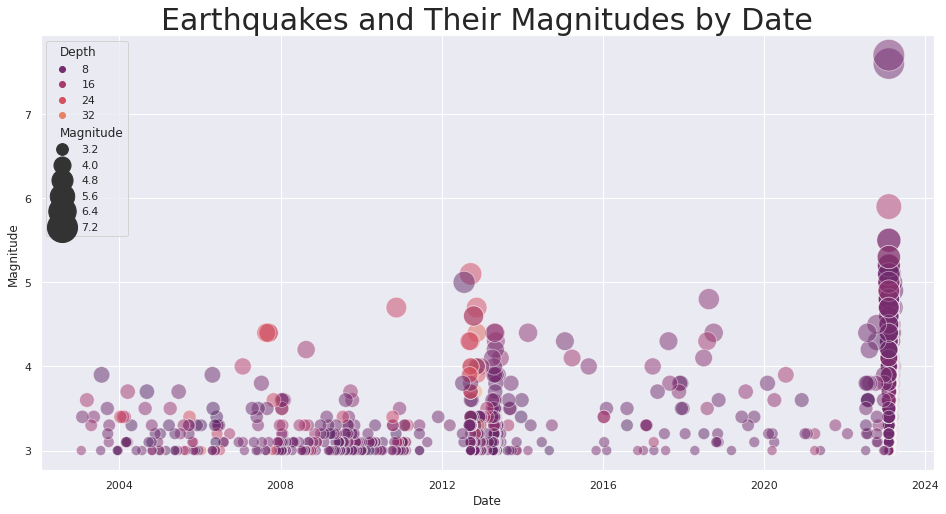

In [ ]:
sns.scatterplot(data=df,x=df.Date,y='Magnitude',hue='Depth',size='Magnitude',sizes = (100,1000),palette="flare_r",alpha=0.5).set_title('Earthquakes and Their Magnitudes by Date', fontsize=30)
plt.show()

### **I created a report with the pandas_profiling module to get more detailed information about the data.**

In [ ]:
profile = ProfileReport(df, title="Kahramanmaras Earthquakes Report")

In [ ]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### **The high correlations caught my attention in the generated report and I created the correlation graph.**

Text(0.5, 1.0, 'Correlations Between Entities')

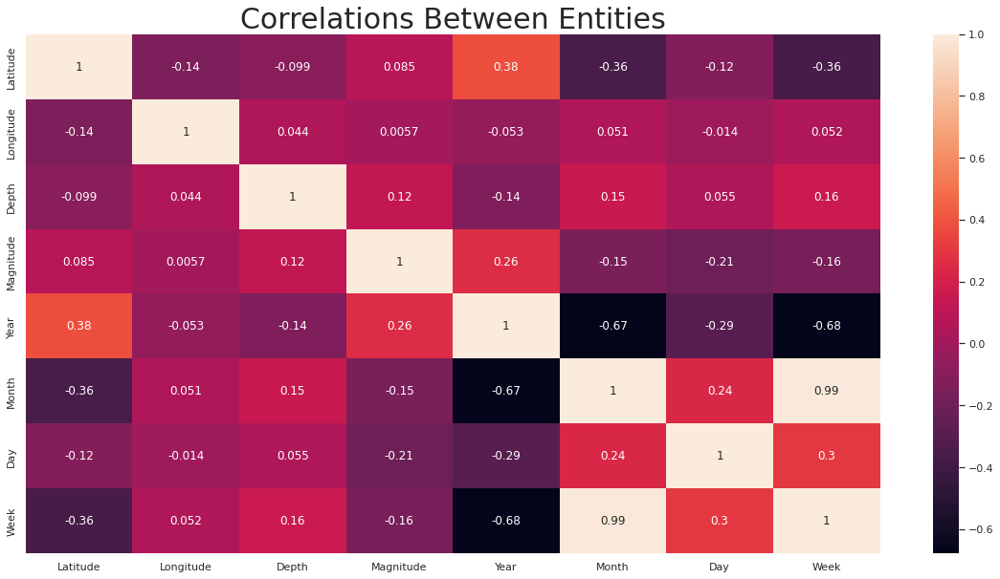

In [ ]:
plt.figure(figsize=(20,10))
column_list = ["Latitude","Longitude","Depth","Magnitude","Year","Month","Day","Date","Week"]
cor = df[column_list].corr()
sns.heatmap(cor,annot=True).set_title('Correlations Between Entities', fontsize=30)

### **In this figure, we can see the earthquakes and their magnitudes in the region according to latitude and longitude.**

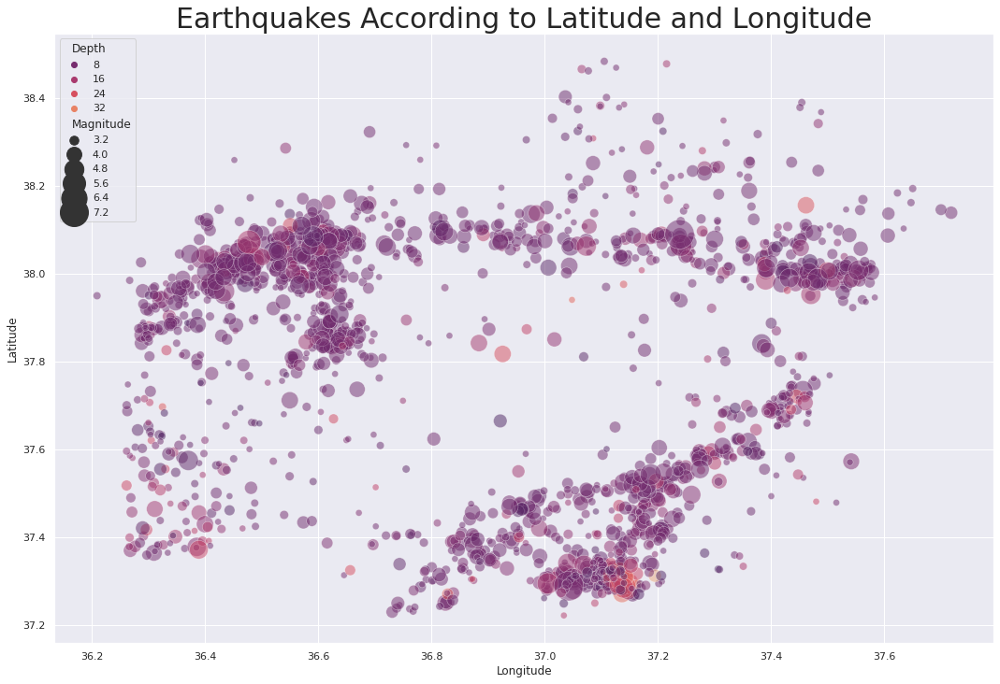

In [ ]:
sns.set(rc={'figure.figsize':(18,12)})
sns.scatterplot(data=df,x='Longitude',y='Latitude',hue='Depth',size='Magnitude',sizes = (50,1000),palette="flare_r",alpha=0.5).set_title('Earthquakes According to Latitude and Longitude', fontsize=30)
plt.show()

### **I'm using the plotly library to see the density map of earthquakes.**

In [ ]:
fig = px.density_mapbox(df, lat='Latitude', lon='Longitude', z='Magnitude', radius=8,center=dict(lat=39, lon=37), zoom=5,mapbox_style="stamen-terrain")
fig.update_layout(title="Density Map of the Region (Interactive Map)")
fig.show()

### **I thought of making a safe zone classification by using the density graph of the earthquakes in the region.**

Text(0.5, 1.0, 'Density Plot of the Eartquakes')

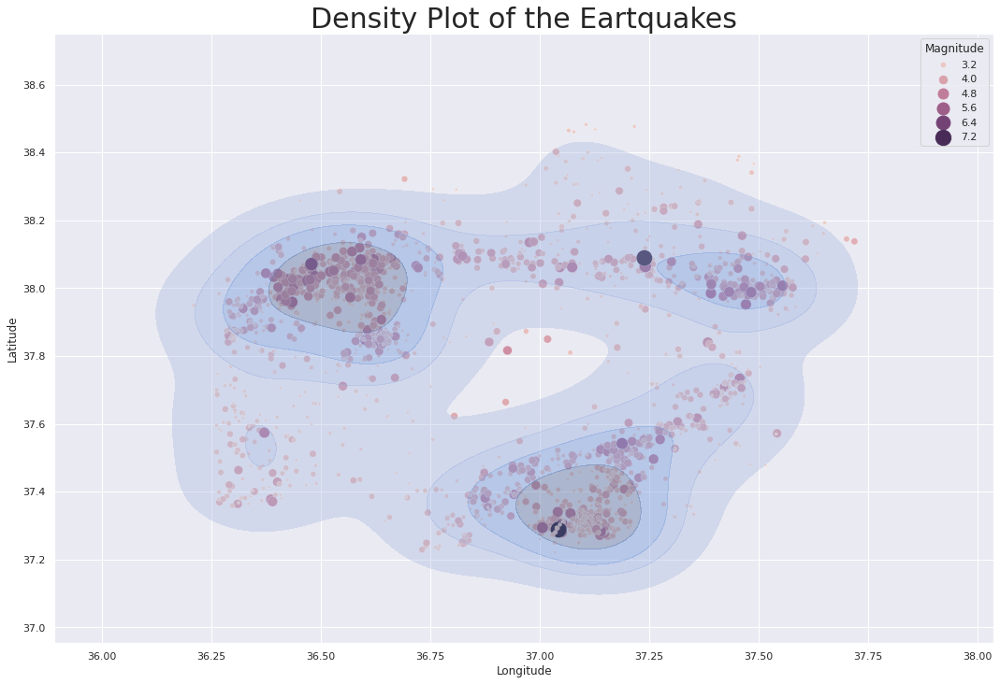

In [ ]:
sns.scatterplot(data=df,x="Longitude", y="Latitude",hue='Magnitude', size='Magnitude', sizes=(10,300), color="0")
sns.kdeplot(data=df,x="Longitude", y="Latitude", levels=5, color="b", fill=True, alpha=0.4).set_title('Density Plot of the Eartquakes', fontsize=30)

### **It is interesting that there were many earthquakes in the same region about 10 years before the 7.7 earthquake.**

Text(0.5, 1.0, 'Earthquake Magnitudes and Years by Region')

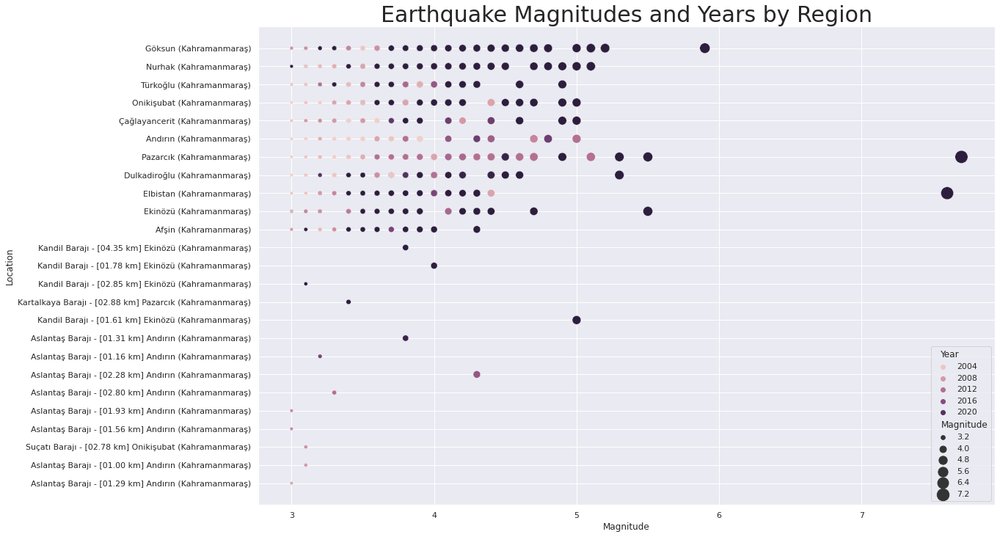

In [ ]:
sns.scatterplot(data=df,x="Magnitude",y="Location",hue="Year",size='Magnitude',sizes=(20,300)).set_title('Earthquake Magnitudes and Years by Region', fontsize=30)

### **I added a destructiveness column for classification according to the magnitude of the earthquakes.**

In [ ]:
df.loc[df['Magnitude'] <= 5 , 'Destructiveness'] = 'No significant damage.'
df.loc[(df['Magnitude'] >= 5) & (df['Magnitude'] <= 6) , 'Destructiveness'] = 'Damage to buildings may occur.'
df.loc[(df['Magnitude'] >= 6) & (df['Magnitude'] <= 7) , 'Destructiveness'] = 'High probability of major damage.'
df.loc[(df['Magnitude'] >= 7) & (df['Magnitude'] <= 8) , 'Destructiveness'] = 'Widespread damage!'

In [ ]:
df.head()

,Date,Longitude,Latitude,Depth,Rms,Type,Magnitude,Location,EventID,Time,Day,Month,Year,Week,Destructiveness
10,2023-03-15,36.611,38.014,6.98,0.44,ML,3.3,Göksun (Kahramanmaraş),563171,07:51,15,3,2023,11,No significant damage.
19,2023-03-15,37.494,37.984,7.72,0.34,MW,4.0,Nurhak (Kahramanmaraş),563139,05:49,15,3,2023,11,No significant damage.
32,2023-03-15,36.787,37.387,7.00,0.49,ML,3.2,Türkoğlu (Kahramanmaraş),563116,04:27,15,3,2023,11,No significant damage.
34,2023-03-15,37.534,38.019,7.00,0.58,ML,3.0,Nurhak (Kahramanmaraş),563117,04:22,15,3,2023,11,No significant damage.
100,2023-03-14,36.951,38.058,11.04,0.52,ML,3.1,Göksun (Kahramanmaraş),562937,20:30,14,3,2023,11,No significant damage.


### **This is a pie chart showing destructiveness.**

In [ ]:
dest_freq = df['Destructiveness'].value_counts()

In [ ]:
fig = px.pie(dest_freq, values=dest_freq, names=dest_freq.index,width=1200, height=600)
fig.update_layout(title="Number of Earthquakes by Destructiveness (Displays Information When Hover)")
fig.show()